#### Imports & Loading Data

In [1]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Paths for original images, masked images, and ground truth
original_images_path = "/kaggle/input/face-mask-lite-dataset/without_mask"  # Update this path
masked_images_path = "/kaggle/working/masked_images"  # Update this path
ground_truth_path = "/kaggle/working/ground_truth"  # Update this path

# Ensure output directories exist
os.makedirs(masked_images_path, exist_ok=True)
os.makedirs(ground_truth_path, exist_ok=True)

# Load OpenCV pre-trained face detector (Haar Cascade for frontal face detection)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def apply_random_face_distortion(image):
    """
    Apply random distortions to different parts of the face.
    Parameters:
        image: Input image as a numpy array.
    Returns:
        masked_image: Image with random distortions on the face.
    """
    # Convert to grayscale for face detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
    if len(faces) == 0:
        return image, None  # No face detected

    # Choose the first face detected (you can modify this to handle multiple faces)
    x, y, w, h = faces[0]  # Face region (x, y, width, height)

    # Create a mask
    mask = np.zeros_like(image, dtype=np.uint8)

    # Randomly select a region of the face to distort
    regions = [
        {"name": "forehead", "x": x + w // 4, "y": y, "width": w // 2, "height": h // 4},
        {"name": "left_eye", "x": x + w // 6, "y": y + h // 4, "width": w // 4, "height": h // 6},
        {"name": "right_eye", "x": x + w // 2, "y": y + h // 4, "width": w // 4, "height": h // 6},
        {"name": "mouth", "x": x + w // 4, "y": y + h // 2, "width": w // 2, "height": h // 4},
        {"name": "left_cheek", "x": x, "y": y + h // 3, "width": w // 3, "height": h // 3},
        {"name": "right_cheek", "x": x + 2 * w // 3, "y": y + h // 3, "width": w // 3, "height": h // 3},
    ]
    
    selected_region = np.random.choice(regions)

    # Generate random distortion shape
    num_points = np.random.randint(5, 12)  # Random number of points for the polygon shape
    angles = np.linspace(0, 2 * np.pi, num_points, endpoint=False)
    x_points = (
        (selected_region["x"] + selected_region["width"] * 0.5 * np.cos(angles)) +
        np.random.uniform(-selected_region["width"] * 0.2, selected_region["width"] * 0.2, size=num_points)
    ).astype(int)
    y_points = (
        (selected_region["y"] + selected_region["height"] * 0.5 * np.sin(angles)) +
        np.random.uniform(-selected_region["height"] * 0.2, selected_region["height"] * 0.2, size=num_points)
    ).astype(int)
    points = np.array(list(zip(x_points, y_points)), dtype=np.int32)

    # Apply the random mask to the image (white polygon)
    cv2.fillPoly(mask, [points], (255, 255, 255))

    # Combine the original image with the mask to create the masked image
    masked_image = cv2.bitwise_and(image, cv2.bitwise_not(mask)) + mask

    return masked_image, mask

# Limit to 2000 images
max_images = 3000
processed_images = 0

# Loop through all images in the original images folder
for filename in tqdm(os.listdir(original_images_path)):
    if processed_images >= max_images:
        break  # Stop once we have processed 2000 images
    
    if filename.lower().endswith((".jpg", ".png", ".jpeg")):
        # Read the original image
        image_path = os.path.join(original_images_path, filename)
        image = cv2.imread(image_path)

        # Skip if the image cannot be read
        if image is None:
            print(f"Warning: Failed to read {filename}")
            continue
        
        # Apply random distortion to the face
        masked_image, mask = apply_random_face_distortion(image)

        # Save the masked image and ground truth
        cv2.imwrite(os.path.join(masked_images_path, filename), masked_image)
        cv2.imwrite(os.path.join(ground_truth_path, filename), image)
        
        # Increment the counter for processed images
        processed_images += 1

print(f"Processed {processed_images} images.")


 30%|███       | 3000/10000 [16:55<39:30,  2.95it/s] 

Processed 3000 images.


In [2]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Paths for original images, masked images, and ground truth
original_images_path = "/kaggle/input/face-mask-lite-dataset/without_mask"  # Update this path
masked_images_path = "/kaggle/working/test_masked_images"  # Update this path
ground_truth_path = "/kaggle/working/test_ground_truth"  # Update this path

# Ensure output directories exist
os.makedirs(masked_images_path, exist_ok=True)
os.makedirs(ground_truth_path, exist_ok=True)

# Load OpenCV pre-trained face detector (Haar Cascade for frontal face detection)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def apply_random_face_distortion(image):
    """
    Apply random distortions to different parts of the face.
    Parameters:
        image: Input image as a numpy array.
    Returns:
        masked_image: Image with random distortions on the face.
    """
    # Convert to grayscale for face detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
    if len(faces) == 0:
        return image, None  # No face detected

    # Choose the first face detected (you can modify this to handle multiple faces)
    x, y, w, h = faces[0]  # Face region (x, y, width, height)

    # Create a mask
    mask = np.zeros_like(image, dtype=np.uint8)

    # Randomly select a region of the face to distort
    regions = [
        {"name": "forehead", "x": x + w // 4, "y": y, "width": w // 2, "height": h // 4},
        {"name": "left_eye", "x": x + w // 6, "y": y + h // 4, "width": w // 4, "height": h // 6},
        {"name": "right_eye", "x": x + w // 2, "y": y + h // 4, "width": w // 4, "height": h // 6},
        {"name": "mouth", "x": x + w // 4, "y": y + h // 2, "width": w // 2, "height": h // 4},
        {"name": "left_cheek", "x": x, "y": y + h // 3, "width": w // 3, "height": h // 3},
        {"name": "right_cheek", "x": x + 2 * w // 3, "y": y + h // 3, "width": w // 3, "height": h // 3},
    ]
    
    selected_region = np.random.choice(regions)

    # Generate random distortion shape
    num_points = np.random.randint(5, 12)  # Random number of points for the polygon shape
    angles = np.linspace(0, 2 * np.pi, num_points, endpoint=False)
    x_points = (
        (selected_region["x"] + selected_region["width"] * 0.5 * np.cos(angles)) +
        np.random.uniform(-selected_region["width"] * 0.2, selected_region["width"] * 0.2, size=num_points)
    ).astype(int)
    y_points = (
        (selected_region["y"] + selected_region["height"] * 0.5 * np.sin(angles)) +
        np.random.uniform(-selected_region["height"] * 0.2, selected_region["height"] * 0.2, size=num_points)
    ).astype(int)
    points = np.array(list(zip(x_points, y_points)), dtype=np.int32)

    # Apply the random mask to the image (white polygon)
    cv2.fillPoly(mask, [points], (255, 255, 255))

    # Combine the original image with the mask to create the masked image
    masked_image = cv2.bitwise_and(image, cv2.bitwise_not(mask)) + mask

    return masked_image, mask

# Limit to 1000 images
max_images = 1000
processed_images = 0

# Loop through all images in the ground truth folder
for filename in tqdm(os.listdir(original_images_path)):
    if processed_images>=1100:
        break
    if processed_images >= max_images:
         # Stop once we have processed 1000 images
    
        if filename.lower().endswith((".jpg", ".png", ".jpeg")):
            # Read the original image
            image_path = os.path.join(original_images_path, filename)
            image = cv2.imread(image_path)
    
            # Skip if the image cannot be read
            if image is None:
                print(f"Warning: Failed to read {filename}")
                continue
            
            # Apply subtle distortion to the face
            masked_image, mask = apply_random_face_distortion(image)
    
            # Save the masked image and ground truth
            cv2.imwrite(os.path.join(masked_images_path, filename), masked_image)
            cv2.imwrite(os.path.join(ground_truth_path, filename), image)
            
            # Increment the counter for processed images
    processed_images += 1

print(f"Processed {processed_images} images.")


 11%|█         | 1100/10000 [00:32<04:22, 33.87it/s]  

Processed 1100 images.


In [3]:
import tensorflow as tf
import glob
from PIL import Image
import numpy as np # linear algebra
import pandas as pd
from tensorflow import keras
from tensorflow.keras import preprocessing
import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Rescaling
import tensorflow as tf

import os
import pathlib
import time
import datetime
import cv2 as cv
from matplotlib import pyplot as plt
from IPython import display
from IPython.display import clear_output
# import segmentation_models as sm

Displaying samples from the training set:


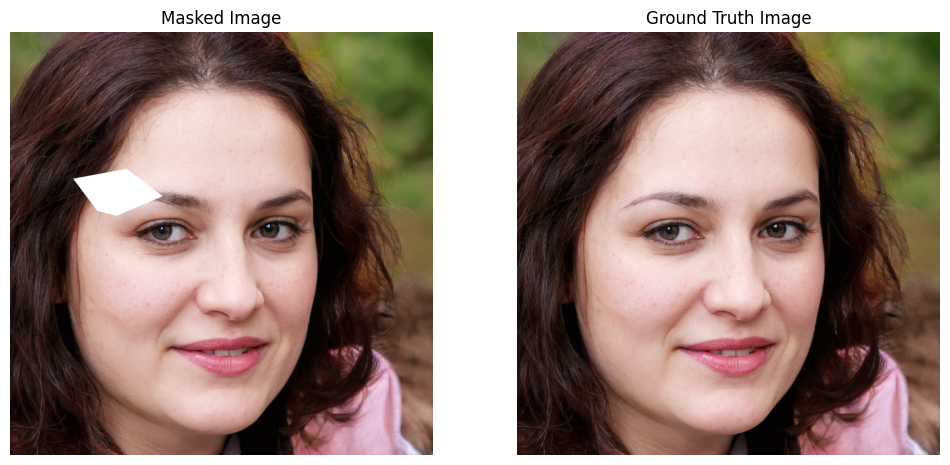

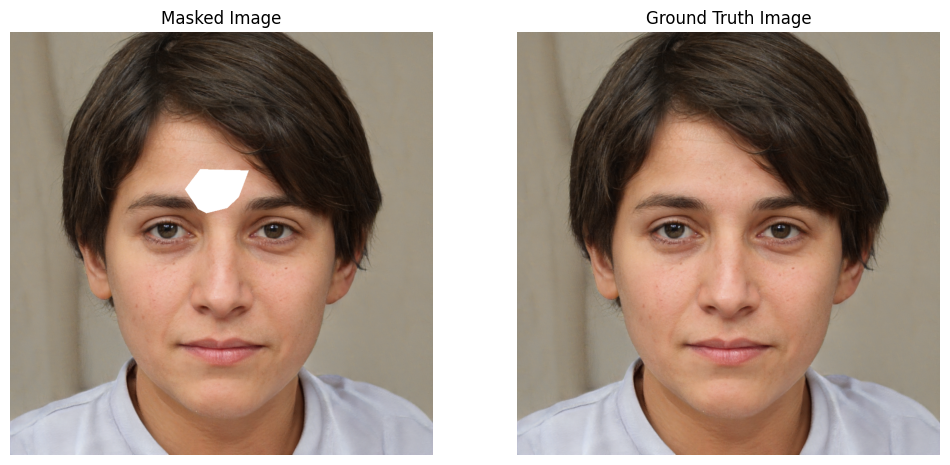

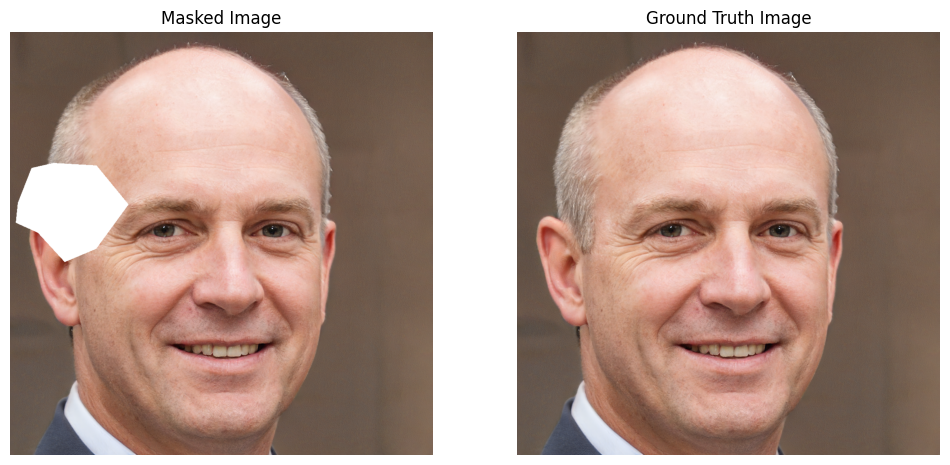

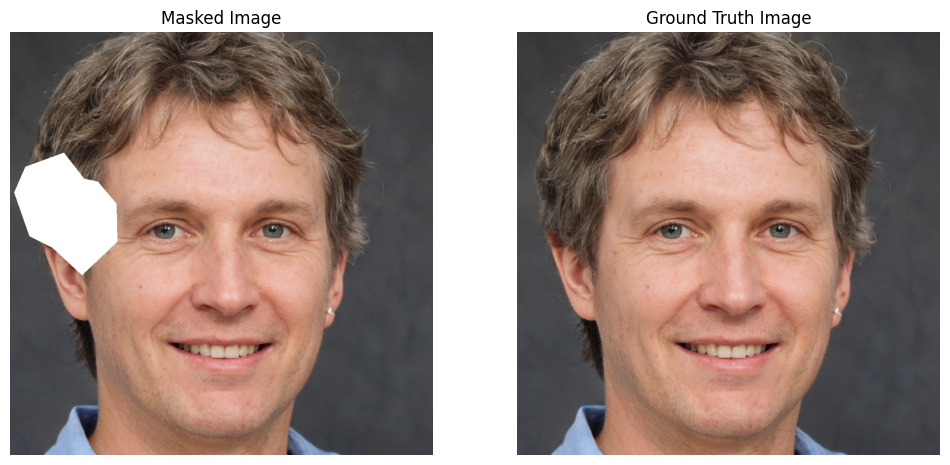

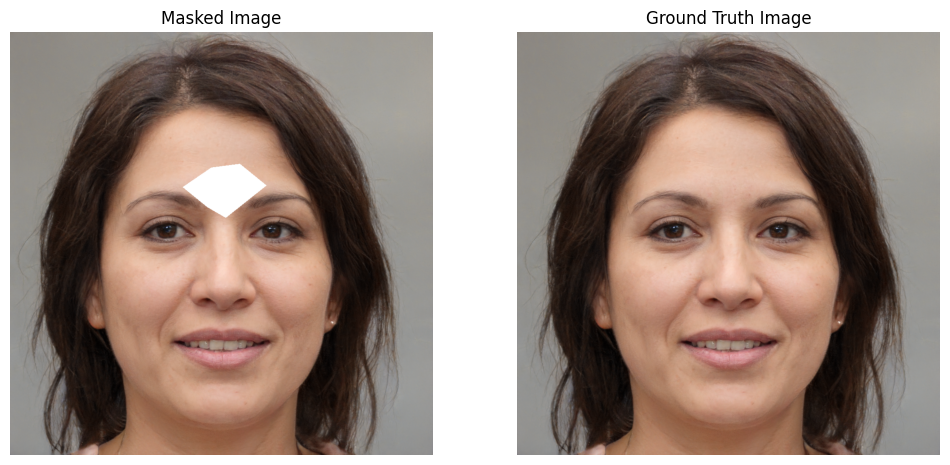


Displaying samples from the testing set:


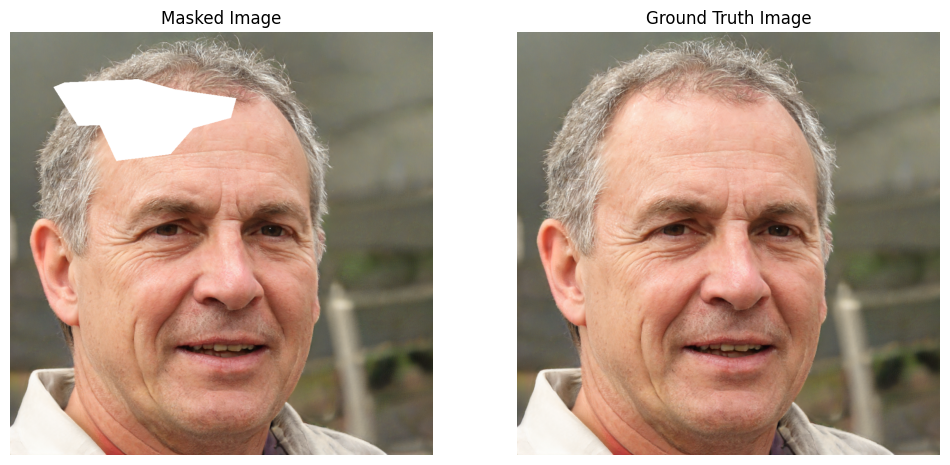

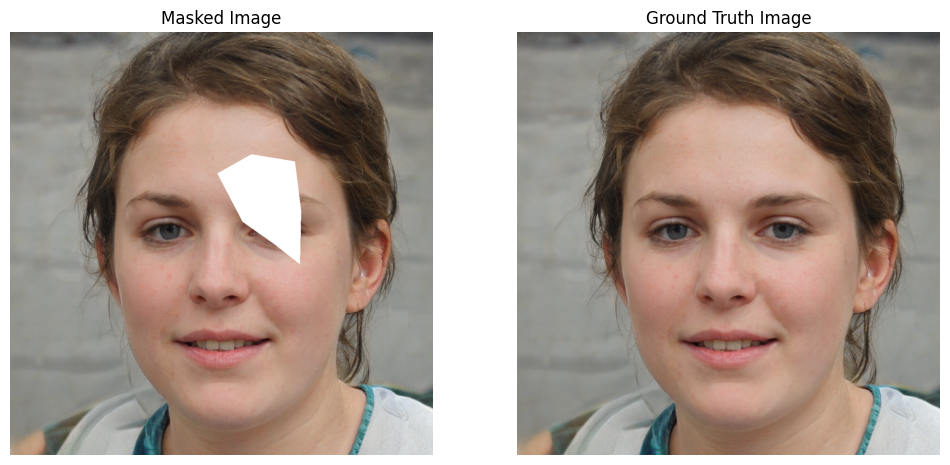

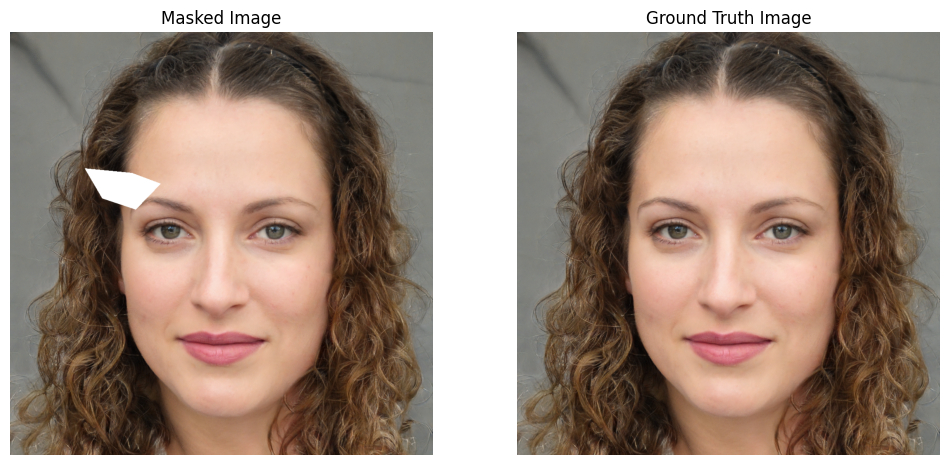

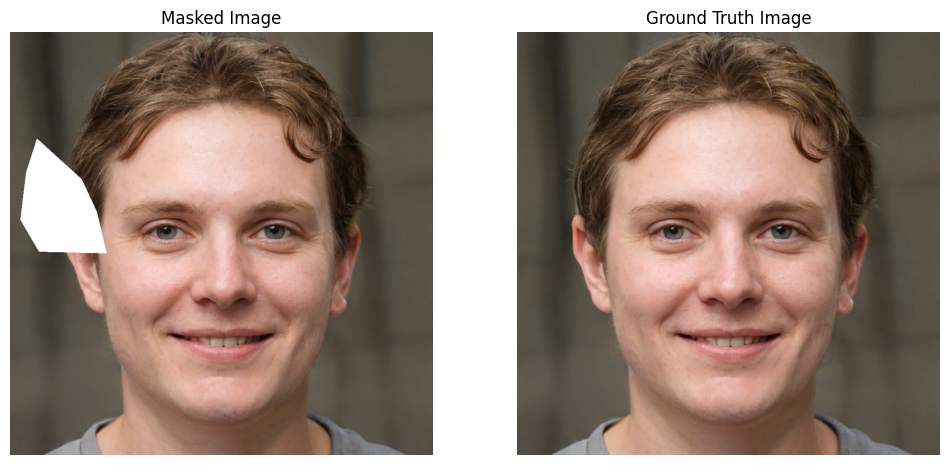

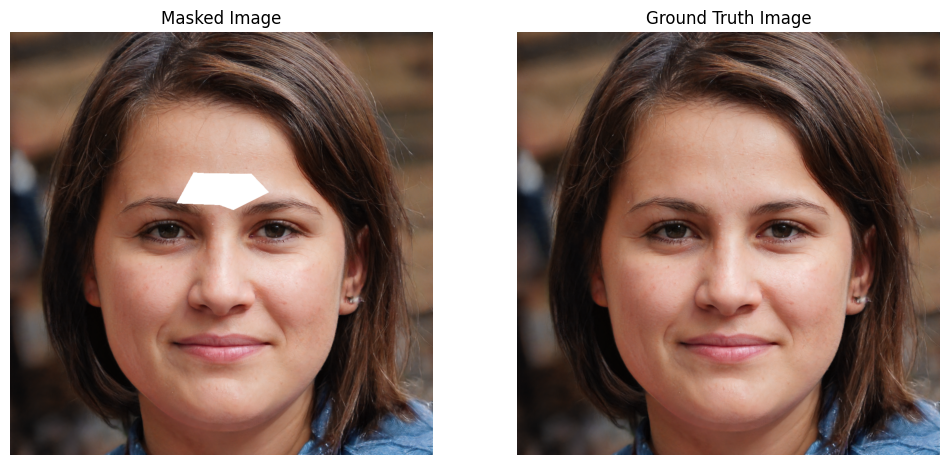

In [4]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Train and test folders for masked images and ground truth
train_masked_folder = "/kaggle/working/masked_images"
test_masked_folder = "/kaggle/working/test_masked_images"
train_ground_truth_folder = "/kaggle/working/ground_truth"
test_ground_truth_folder = "/kaggle/working/test_ground_truth"

# Function to show images using subplots
def show_images(masked_image_path, ground_truth_image_path):
    """
    Show the masked image and the ground truth image side by side.
    """
    # Read the masked and ground truth images
    masked_image = cv2.imread(masked_image_path)
    ground_truth_image = cv2.imread(ground_truth_image_path)

    # Convert BGR to RGB
    masked_image_rgb = cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB)
    ground_truth_image_rgb = cv2.cvtColor(ground_truth_image, cv2.COLOR_BGR2RGB)

    # Plot the images side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot masked image
    axes[0].imshow(masked_image_rgb)
    axes[0].set_title('Masked Image')
    axes[0].axis('off')

    # Plot ground truth image
    axes[1].imshow(ground_truth_image_rgb)
    axes[1].set_title('Ground Truth Image')
    axes[1].axis('off')

    # Show the plot
    plt.show()

# Number of random samples to display
num_samples = 5  # Adjust this as needed

# Function to sample and display images
def display_sample_images(masked_folder, ground_truth_folder, num_samples):
    """
    Randomly sample and display masked images alongside their corresponding ground truth images.
    """
    # Get list of image filenames in the masked folder
    filenames = [f for f in os.listdir(masked_folder) if f.lower().endswith((".jpg", ".png", ".jpeg"))]

    # Randomly select 'num_samples' images
    sampled_filenames = random.sample(filenames, min(num_samples, len(filenames)))

    # Display images from the sampled filenames
    for filename in sampled_filenames:
        # Paths to the masked image and ground truth
        masked_image_path = os.path.join(masked_folder, filename)
        ground_truth_image_path = os.path.join(ground_truth_folder, filename)

        # Show the images side by side
        show_images(masked_image_path, ground_truth_image_path)

# Display random samples from the train and test sets
print("Displaying samples from the training set:")
display_sample_images(train_masked_folder, train_ground_truth_folder, num_samples)

print("\nDisplaying samples from the testing set:")
display_sample_images(test_masked_folder, test_ground_truth_folder, num_samples)


In [5]:
masked_data_path = "/kaggle/working/masked_images"
unmasked_data_path = "/kaggle/working/ground_truth"
test_dataset = "/kaggle/working/test_masked_images"

In [6]:
masked_data = keras.utils.image_dataset_from_directory(directory=masked_data_path, batch_size=1, image_size=[256, 256], labels="inferred", label_mode=None, shuffle=False)
unmasked_data = keras.utils.image_dataset_from_directory(directory=unmasked_data_path, batch_size=1, image_size=[256, 256], labels="inferred", label_mode=None, shuffle=False)
ts_dataset = keras.utils.image_dataset_from_directory(directory=test_dataset, batch_size=1, image_size=[256, 256], labels="inferred", label_mode=None, shuffle=False)
file_paths = ts_dataset.file_paths

Found 3000 files.
Found 3000 files.
Found 100 files.


In [7]:
dataset = tf.data.Dataset.zip((masked_data, unmasked_data))
file_paths[:5]

['/kaggle/working/test_masked_images/seed0018.png',
 '/kaggle/working/test_masked_images/seed0271.png',
 '/kaggle/working/test_masked_images/seed0308.png',
 '/kaggle/working/test_masked_images/seed0359.png',
 '/kaggle/working/test_masked_images/seed0486.png']

In [8]:
dataset

<_ZipDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [9]:
train_size = int(0.8*dataset.cardinality().numpy())

train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)

In [10]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
    input_image = tf.cast(input_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

In [11]:
AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.map(normalize, num_parallel_calls=AUTOTUNE)
val_dataset = val_dataset.map(normalize, num_parallel_calls=AUTOTUNE)

In [12]:
unmasked_data_test='/kaggle/working/test_ground_truth'
unmask_test_dataset = keras.utils.image_dataset_from_directory(directory=unmasked_data_test, batch_size=1, image_size=[256, 256], labels="inferred", label_mode=None, shuffle=False)

Found 100 files.


In [13]:
test_dataset = tf.data.Dataset.zip((ts_dataset, unmask_test_dataset))

In [14]:

test_dataset = test_dataset.map(normalize, num_parallel_calls=AUTOTUNE)

In [15]:
AUTOTUNE 

-1

### Defining Model

In [16]:
OUTPUT_CHANNELS = 3
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

In [17]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result



#### Generator

In [18]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
    ]

    up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)


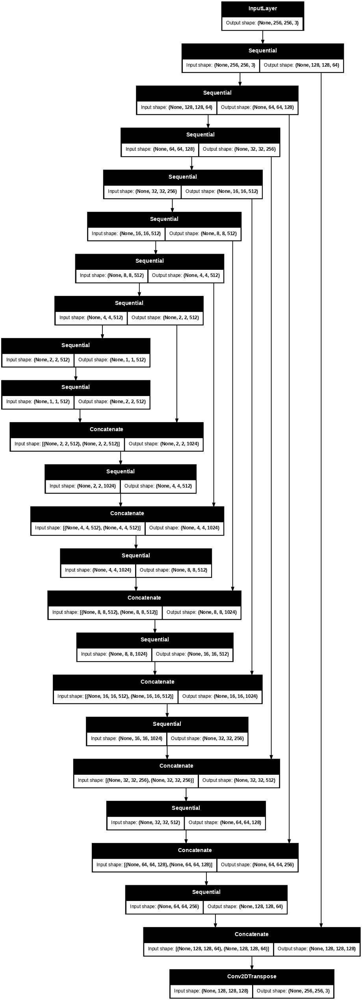

In [19]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)


#### Discriminator

In [20]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)


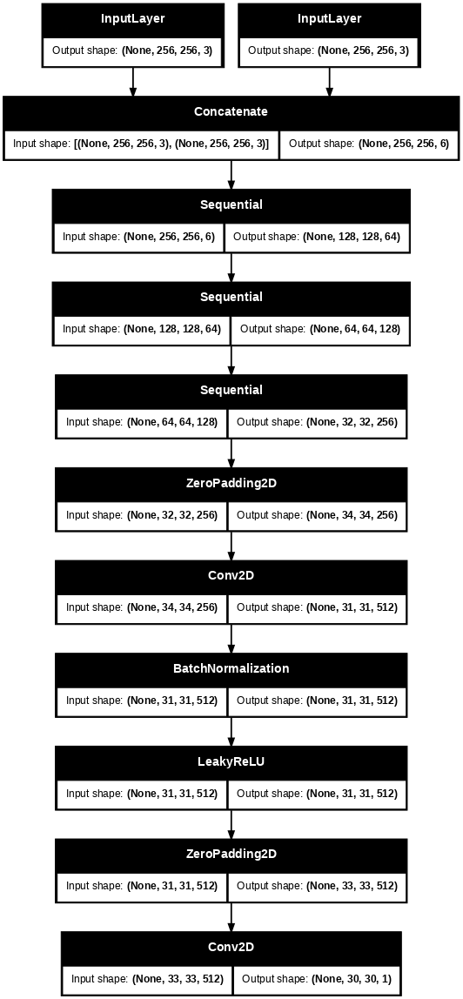

In [21]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)


In [22]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss


In [23]:
generator_optimizer = tf.keras.optimizers.Adam(5e-5, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(5e-5, beta_1=0.5)


In [24]:
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [25]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()



### Train Function

In [26]:
@tf.function
def train_step(input_image, target, step):
    print(step)
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)


In [28]:
LAMBDA = 100

In [29]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [30]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

In [31]:
def fit(train_ds, test_ds, steps):
    example_input, example_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")
        
        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)


        # Save (checkpoint) the model every 10k steps
        if (step + 1) % 10000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)


In [32]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))


In [33]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


### Training

Time taken for 1000 steps: 67.00 sec



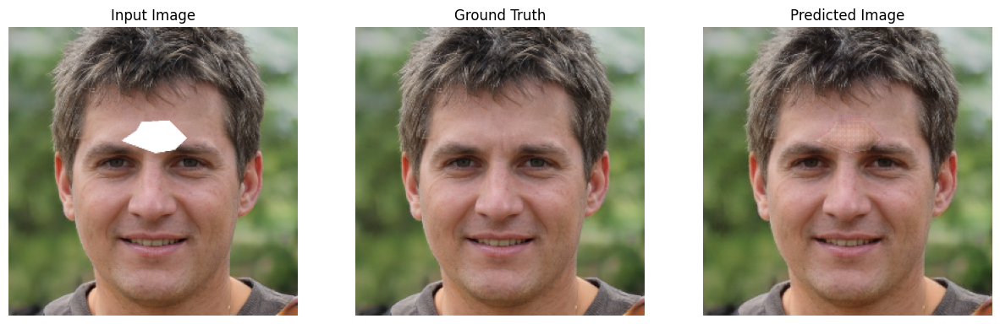

Step: 24k
..............................

In [ ]:
fit(train_dataset, val_dataset, steps=30000)

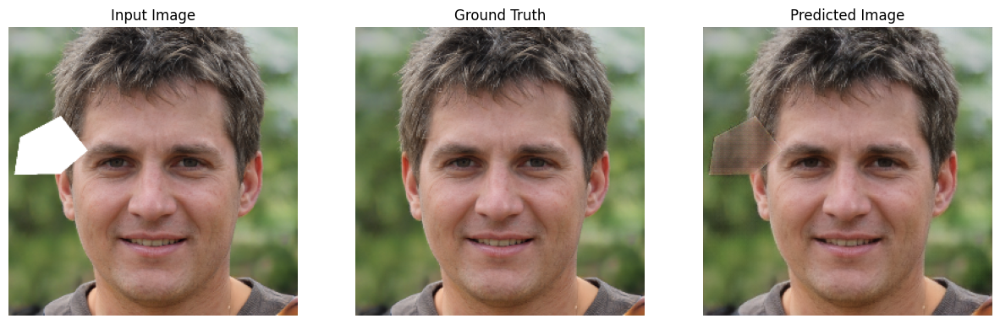

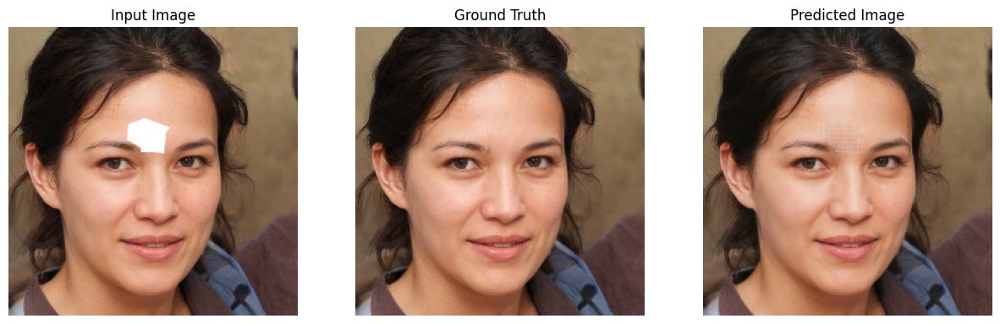

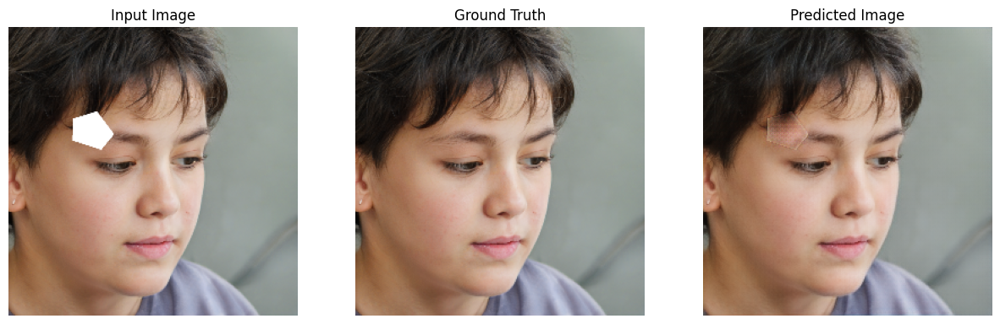

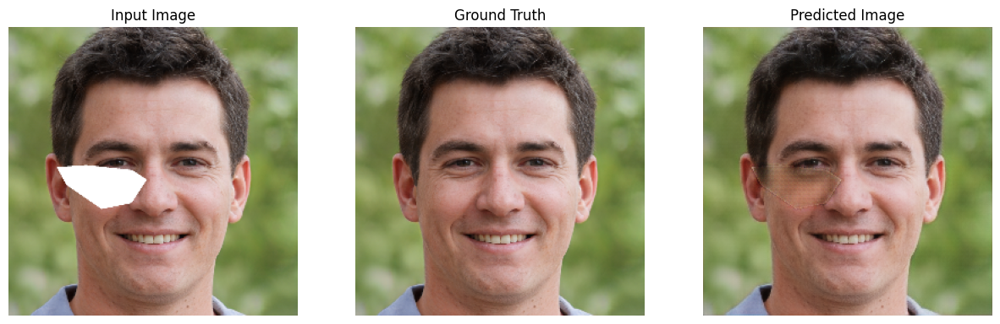

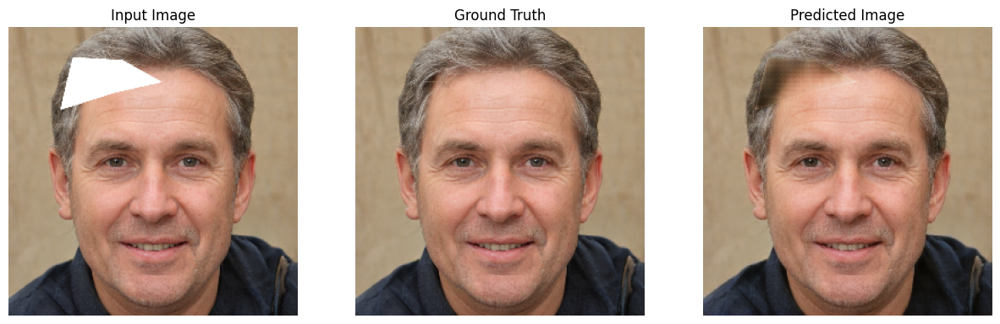

In [35]:
# Run the trained model on a few examples from the validation set
for inp, tar in val_dataset.take(5):
    generate_images(generator, inp, tar)

In [36]:
import os
import tensorflow as tf

# Define the checkpoint directory and checkpoint structure
checkpoint_dir = './training_checkpoints'
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# Restore the latest checkpoint
latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
if latest_checkpoint:
    checkpoint.restore(latest_checkpoint)
    print("Checkpoint restored successfully from:", latest_checkpoint)
else:
    print("No checkpoint found in:", checkpoint_dir)


Checkpoint restored successfully from: ./training_checkpoints/ckpt-3


In [37]:
import tensorflow as tf
import os

# Path to the checkpoint directory
checkpoint_dir = './training_checkpoints'

# Initialize the model (generator and/or discriminator)
geno = Generator()  # Replace with your generator model function
discro = Discriminator()  # Replace with your discriminator model function

# Define optimizer (if needed)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Define the checkpoint
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=geno,
                                 discriminator=discro)

# Restore the checkpoint
latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
if latest_checkpoint:
    checkpoint.restore(latest_checkpoint)
    print("Checkpoint restored successfully from:", latest_checkpoint)
else:
    print("No checkpoint found in:", checkpoint_dir)

Checkpoint restored successfully from: ./training_checkpoints/ckpt-3


In [85]:
import shutil
import os

# Path to the checkpoint directory
checkpoint_dir = '/kaggle/working/training_checkpoints'

# Output zip file name
output_zip = '/kaggle/working/checkpoint_backup.zip'

# Zip the directory
shutil.make_archive(output_zip.replace('.zip', ''), 'zip', checkpoint_dir)

print(f"Checkpoint directory zipped to {output_zip}")


Checkpoint directory zipped to /kaggle/working/checkpoint_backup.zip


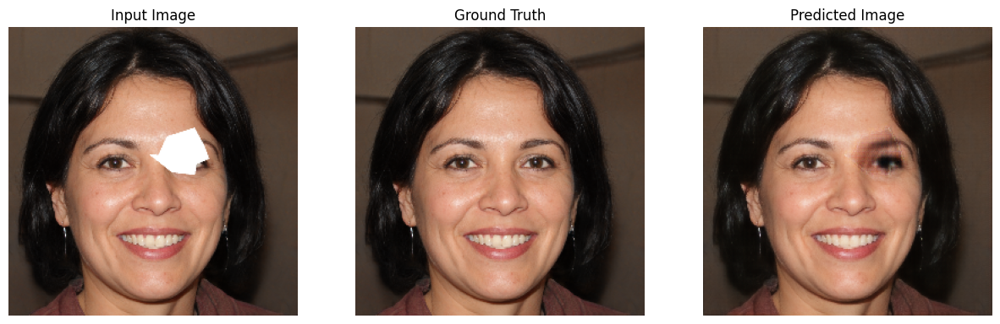

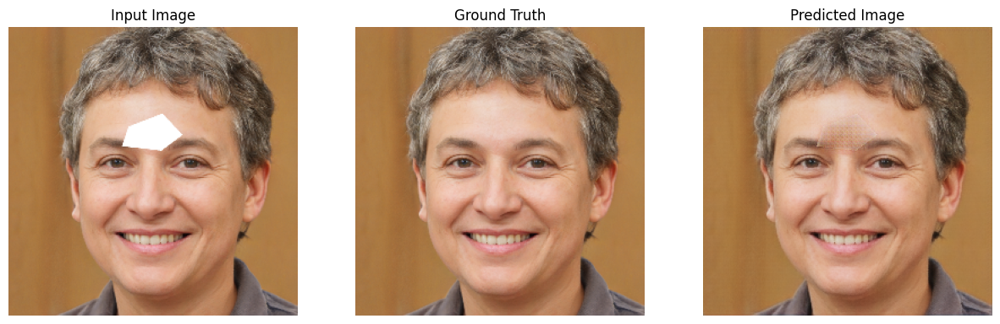

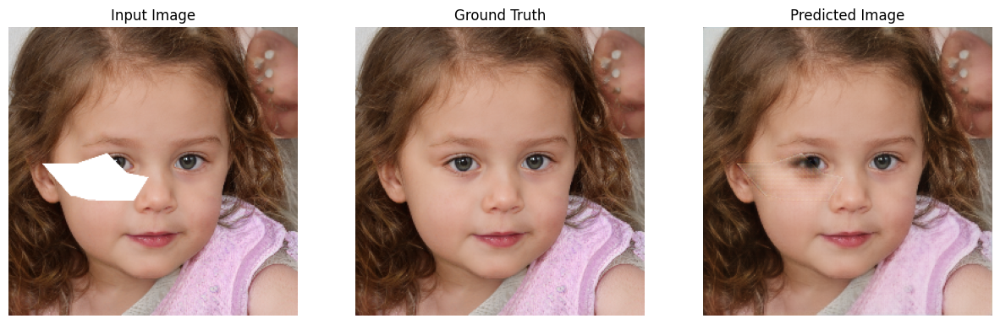

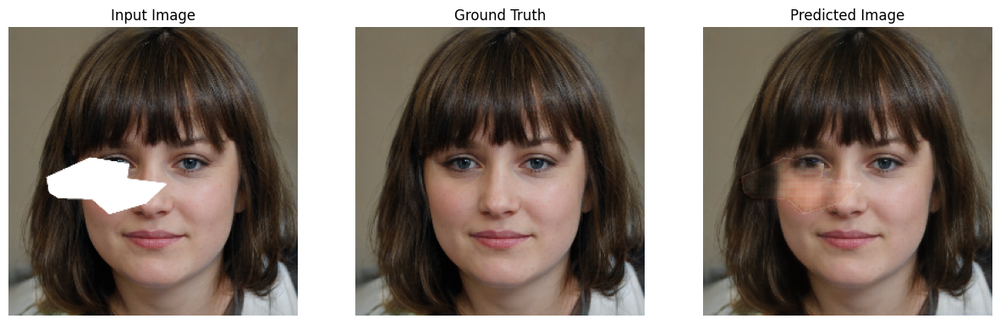

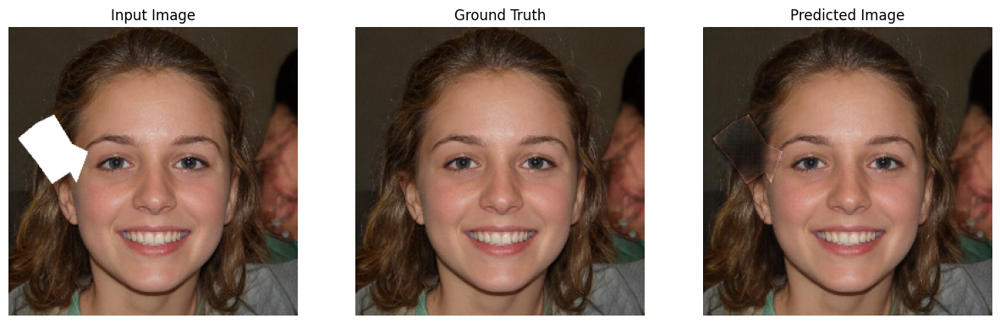

In [38]:
for inp, tar in test_dataset.take(5):
    generate_images(geno, inp, tar)

In [39]:
test_dataset = "/kaggle/input/neww-data"
test_dataset = keras.utils.image_dataset_from_directory(directory=test_dataset, batch_size=1, image_size=[256, 256], labels="inferred", label_mode=None, shuffle=False)
file_paths = test_dataset.file_paths


Found 3 files.


In [40]:
def normalize_test(input_image):
    input_image = tf.cast(input_image, tf.float32)
    input_image = (input_image / 127.5) - 1

    return input_image
test_dataset = test_dataset.map(normalize_test, num_parallel_calls=AUTOTUNE)

In [41]:
import tensorflow as tf
import os

# Path to the checkpoint directory
checkpoint_dir = '/kaggle/working/training_checkpoints'

# Initialize the model (generator and/or discriminator)
geno = Generator()  # Replace with your generator model function
discro = Discriminator()  # Replace with your discriminator model function

# Define optimizer (if needed)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Define the checkpoint
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=geno,
                                 discriminator=discro)

# Restore the checkpoint
latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
if latest_checkpoint:
    checkpoint.restore(latest_checkpoint)
    print("Checkpoint restored successfully from:", latest_checkpoint)
else:
    print("No checkpoint found in:", checkpoint_dir)

Checkpoint restored successfully from: /kaggle/working/training_checkpoints/ckpt-3


In [42]:
def generate_images(model, test_input):
    prediction = model(test_input,training=True)
    plt.figure(figsize=(10, 10))  # Adjust the figure size for two images

    # Display only the Input Image and the Predicted Image
    display_list = [test_input[0], prediction[0]]
    title = ['Input Image', 'Predicted Image']

    for i in range(2):  # Loop through only two images
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()


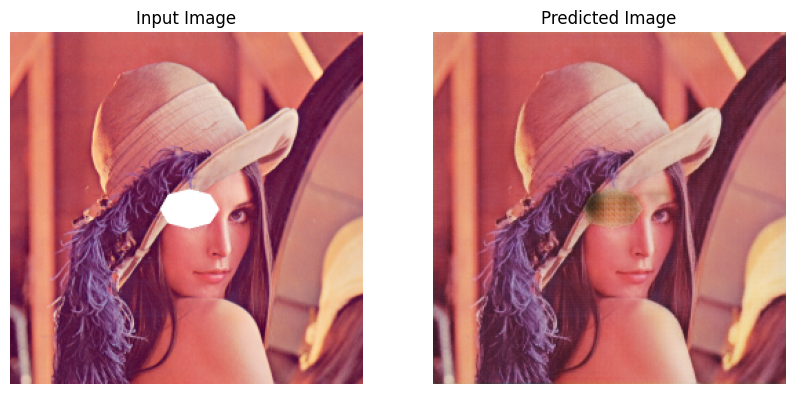

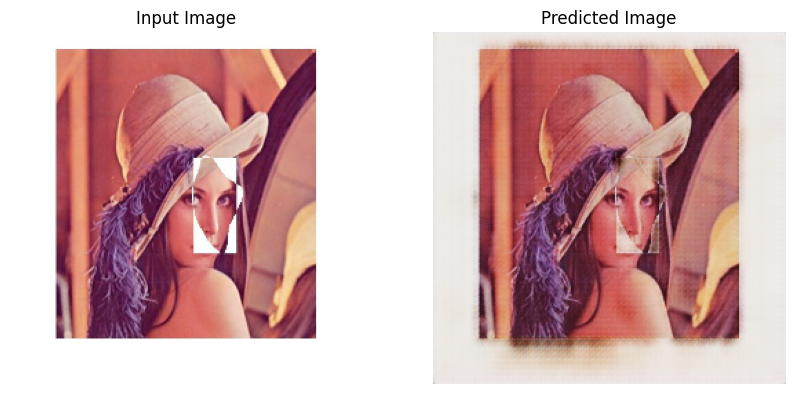

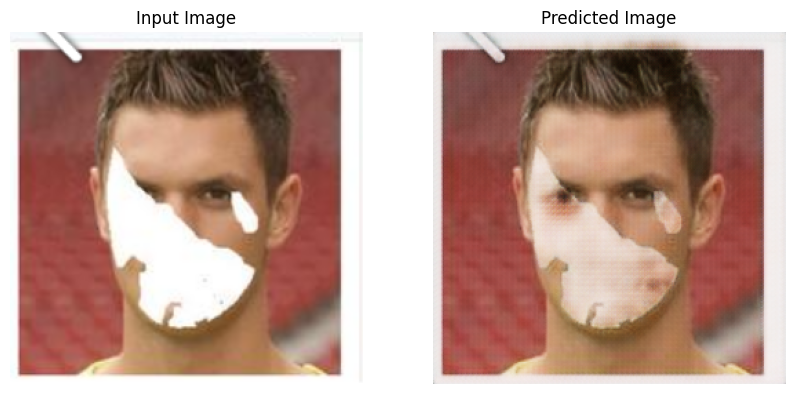

In [43]:
for inp in test_dataset.take(3):
    generate_images(geno,inp)

In [44]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Load a single image
image_path = '/kaggle/working/test_masked_images/seed3504.png'
image = tf.io.read_file(image_path)
image = tf.image.decode_jpeg(image, channels=3)

# Resize to model's input size (adjust size as per your model)
image = tf.image.resize(image, [256, 256])

# Normalize to range [-1, 1] (if your model requires this)
image = (image / 127.5) - 1.0

# Add batch dimension (model expects batch input)
image = tf.expand_dims(image, axis=0)

# Generate prediction
prediction = geno(image, training=True)

# Remove batch dimension and rescale to [0, 1] for visualization
prediction = (prediction[0] * 0.5 + 0.5).numpy()


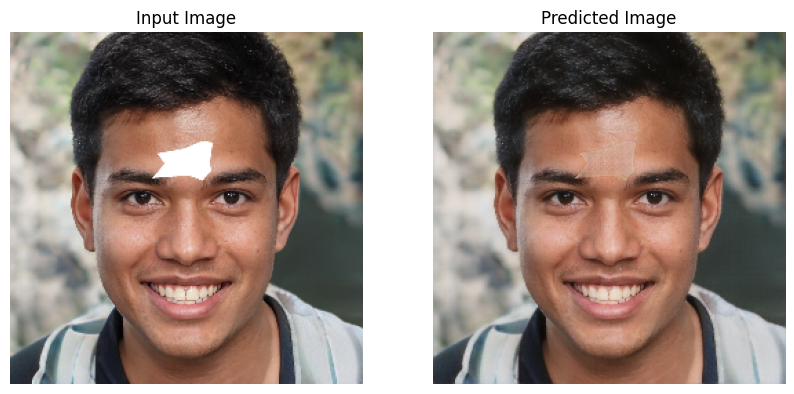

In [45]:
# Visualize input and prediction
plt.figure(figsize=(10, 10))
display_list = [(image[0] * 0.5 + 0.5).numpy(), prediction]  # Rescale input for visualization
titles = ['Input Image', 'Predicted Image']

for i in range(2):
    plt.subplot(1, 2, i + 1)
    plt.title(titles[i])
    plt.imshow(display_list[i])
    plt.axis('off')

plt.show()


In [46]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Load a single image
image_path = '/kaggle/input/neww-data/mask.png'
image = tf.io.read_file(image_path)
image = tf.image.decode_jpeg(image, channels=3)

# Resize to model's input size (adjust size as per your model)
image = tf.image.resize(image, [256, 256])

# Normalize to range [-1, 1] (if your model requires this)
image = (image / 127.5) - 1.0

# Add batch dimension (model expects batch input)
image = tf.expand_dims(image, axis=0)

# Generate prediction
prediction = geno(image, training=True)

# Remove batch dimension and rescale to [0, 1] for visualization
prediction = (prediction[0] * 0.5 + 0.5).numpy()


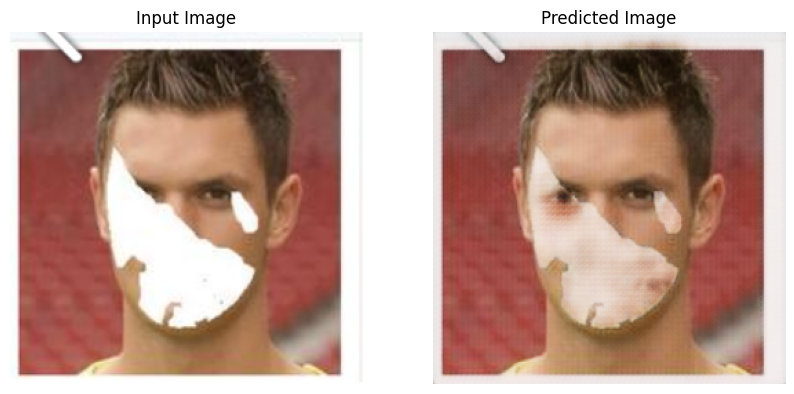

In [47]:
# Visualize input and prediction
plt.figure(figsize=(10, 10))
display_list = [(image[0] * 0.5 + 0.5).numpy(), prediction]  # Rescale input for visualization
titles = ['Input Image', 'Predicted Image']

for i in range(2):
    plt.subplot(1, 2, i + 1)
    plt.title(titles[i])
    plt.imshow(display_list[i])
    plt.axis('off')

plt.show()
